# Growth factor model

In [1]:
import os

import arviz as az
import chi
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import pints
import seaborn as sns
import xarray as xr
sns.set_theme()

The data-generating model is a hierarchical growth factor model
(Dixit et al., 2020) governed by

$$
    p(y, \psi | \theta , t) = p(y | \psi , t)\, p(\psi | \theta),
$$

where $\psi = (p, k_{\mathrm{on}}, k_{\mathrm{off}}, k_{\mathrm{deg}, r}, k_{\mathrm{deg}, a}, \sigma)$ and
$\theta = (\mu_{p}, \mu_{k_{\mathrm{on}}}, \sigma_{p}, \sigma_{k_{\mathrm{on}}}, \theta_{k_{\mathrm{off}}}, \theta_{k_{\mathrm{deg}, r}}, \theta_{k_{\mathrm{deg}, a}}, \theta_{\sigma})$.
The measurements of individuals are governed by a distribution defined by the
mechanistic model-error model pair

$$
    p(y | \psi , t) =
        \mathrm{LN}\left( y | \log \bar{y}(\psi, t), \sigma \right)
$$

with $\bar{y} = c_a$ models the concentration of activated cell receptors which
is described by

$$
    \frac{\mathrm{d}c_r}{\mathrm{d}t} =
        p - k_{\mathrm{on}} c_l c_r + k_{\mathrm{off}} c_a - k_{\mathrm{deg}, r} c_r,
    \quad \text{and}\quad
    \frac{\mathrm{d}c_a}{\mathrm{d}t} =
        k_{\mathrm{on}} c_l c_r - k_{\mathrm{off}} c_a - k_{\mathrm{deg}, a} c_a
$$
with initial conditions $c_r(t=0) = c_a(t=0) = 0$.

The inter-individual variability is governed by the population model

$$
    p(\psi | \theta) =
        \mathcal{N}(p | \mu_{p}, \sigma ^2_{p})\,
        \mathcal{N}(k_{\mathrm{on}} | \mu_{k_{\mathrm{on}}}, \sigma ^2_{k_{\mathrm{on}}})\,
        \delta (k_{\mathrm{off}} - \theta_{k_{\mathrm{off}}})\,
        \delta (k_{\mathrm{deg}, r} - \theta_{k_{\mathrm{deg}, r}})\,
        \delta (k_{\mathrm{deg}, a} - \theta_{k_{\mathrm{deg}, a}})\,
        \delta (\sigma - \theta_{\sigma}).
$$

## Define data-generating model

In [2]:
directory = os.path.dirname(os.getcwd())
mechanistic_model = chi.SBMLModel(
    directory + '/models/dixit_growth_factor_model.xml')
mechanistic_model.set_outputs(['central.receptor_active_concentration'])
mechanistic_model = chi.ReducedMechanisticModel(mechanistic_model)
mechanistic_model.fix_parameters({
    'central.receptor_active_amount': 0,
    'central.receptor_inactive_amount': 0,
    'central.ligand_amount': 2,
    'central.size': 1
})

# Data-generating parameters
population_parameters = [
    1.7,   # Mean activation rate
    0.05,  # Std. activation rate
    8,     # deactivation rate
    0.015, # degradation rate (active)
    0.25,  # degradation rate (inactive)
    1.7,   # Mean production rate
    0.05,  # Std. production rate
    0.05]  # Sigma

## 0. Distributional shape of data-generating process over time

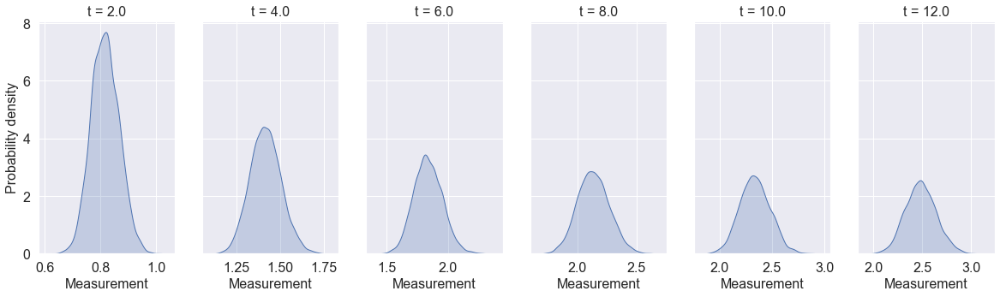

In [3]:
# Define data-generating model
error_model = chi.LogNormalErrorModel()
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate']),
    chi.PooledModel(n_dim=3, dim_names=[
        'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate']),
    chi.PooledModel(dim_names=['Sigma'])])
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
predictive_model = chi.PopulationPredictiveModel(
    predictive_model, population_model)

# Simulate measurements
seed = 2
n_ids = 5000
times = [2, 4, 6, 8, 10, 12]
measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Visualise distributions over time
fontsize = '16'
fig, axes = plt.subplots(1, len(times), figsize=(20, 5), sharey='row')
axes[0].set_ylabel('Probability density', fontsize=fontsize)
for tid, time in enumerate(times):
    # Add title and x-label to subfigure
    axes[tid].set_title('t = %.1f' % time, fontsize=fontsize)
    axes[tid].set_xlabel('Measurement', fontsize=fontsize)
    axes[tid].tick_params(labelsize=fontsize)

    # Plot KDE plot
    sns.kdeplot(
        x=measurements[0, tid], fill=True, linewidth=1, ax=axes[tid],
        legend=False)

plt.show()

## 1. 100 Individuals (non-snapshot data)

In [4]:
# Simulate measurements
seed = 2
n_ids = 100
times = np.linspace(0.1, 15)
measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Swap axes for later convenience
measurements = np.moveaxis(
    measurements, source=(0, 1, 2), destination=(1, 2, 0))

fig = go.Figure()
for idx in range(n_ids):
    fig.add_trace(go.Scatter(
        x=times,
        y=measurements[idx, 0],
        mode='markers+lines',
        name='ID %d' % idx
    ))
fig.update_layout(
    template='plotly_white',
    xaxis_title='Time',
    yaxis_title='Measurement'
)
fig.show()

### Population filter inference

In [37]:
mechanistic_model.fix_parameters({
    'myokit.deactivation_rate': 8,     # deactivation rate
    'myokit.degradation_rate_active_receptor': 0.015, # degradation rate (active)
    'myokit.degradation_rate_inactive_receptor': 0.25,
})

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     10     0.333    3        0:01.1
1     11     0.25     1        0:01.1
2     12     0.25     1        0:01.1
3     15     0.125    2        0:01.2
20    9815   0.747    545      5:49.9
40    26872  0.759    813     15:57.1
60    44291  0.748    830     26:16.6
80    61172  0.753    804     36:18.7
100   79727  0.777    884     47:20.3
120   84287  0.707    218     50:02.9
140   87981  0.746    176     52:13.2
160   91052  0.727    147     54:00.0
180   94319  0.744    156     55:55.4
200   97186  0.768    137     57:36.9
220   99755  0.723    123     59:09.6
240   102515  0.761576 132     60:47.9
260   104694  0.745    104     62:05.0
280   106865  0.731    104     63:24.3
300   110410  0.747    169     65:30.1
320   112264  0.781    89      66:36.6
340   114045  0.742    85      67:39.7
360   115924  0.755    90      68:47.0
380   118155  0.748    107     70:07.1
400   1199

/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.7/site-packages/arviz/plots/traceplot.py:210: UserWarning:

rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (56), generating only 20 plots



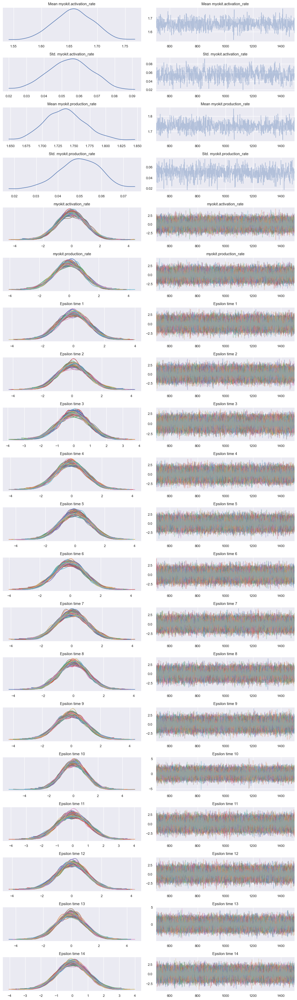

In [8]:
population_filter = chi.GaussianFilter(measurements)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate'], centered=False),
    # chi.PooledModel(n_dim=3, dim_names=[
    #     'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate'], centered=False)])
log_prior = pints.ComposedLogPrior(
    pints.LogNormalLogPrior(1, 0.5),   # Mean activation rate
    pints.LogNormalLogPrior(-2, 0.5),  # Std. activation rate
    # pints.LogNormalLogPrior(2, 0.8),   # deactivation rate
    # pints.LogNormalLogPrior(-3, 0.4),  # degradation rate (active)
    # pints.LogNormalLogPrior(-1, 0.4),  # degradation rate (inactive)
    pints.LogNormalLogPrior(1, 0.5),   # Mean production rate
    pints.LogNormalLogPrior(-2, 0.5))  # Std. production rate
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior,
    sigma=population_parameters[-1], error_on_log_scale=True)

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

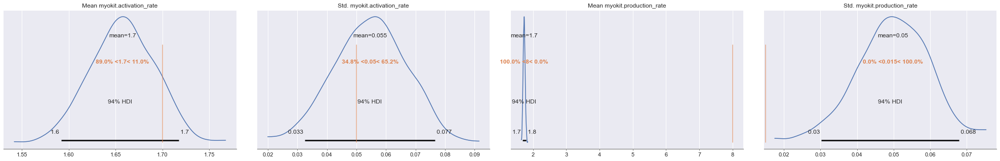

In [11]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean myokit.activation_rate',
        'Std. myokit.activation_rate',
        # 'Pooled Deactivation rate',
        # 'Pooled Deg. rate (act.)',
        # 'Pooled Deg. rate (inact.)',
        'Mean myokit.production_rate',
        'Std. myokit.production_rate'],
    ref_val=population_parameters[:-1])
plt.tight_layout()

### Results

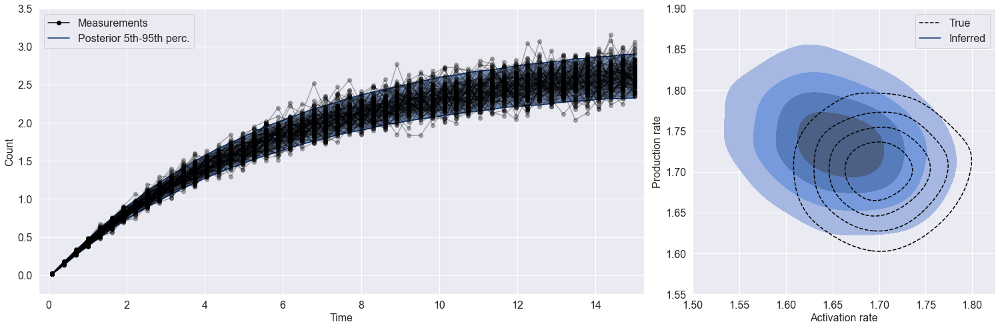

In [26]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(21, 7), gridspec_kw={'width_ratios': [2, 1]})

# Define population model (central parametrisation)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate']),
    # chi.PooledModel(n_dim=3, dim_names=[
    #     'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate'])])

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 5000
parameters =  posterior_samples_filter.sel(draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean myokit.activation_rate'].values.flatten(),
    parameters['Std. myokit.activation_rate'].values.flatten(),
    # parameters['Log std. Initial count'].values.flatten(),
    # parameters['Log std. Growth rate'].values.flatten(),
    parameters['Mean myokit.production_rate'].values.flatten(),
    parameters['Std. myokit.production_rate'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 2))
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes[1])

# Plot population filter inference results (measurement space)
times = np.linspace(0.1, 15)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
simulated_measurements = np.empty(shape=(n_samples, n_times))
parameters = np.empty(shape=(n_samples, 3))
parameters[:, :2] = samples
parameters[:, 2] = population_parameters[-1]
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[0, :, 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
axes[0].plot(
    times, fifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].plot(
    times, ninetyfifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].fill_between(
    times, fifth_percentile, ninetyfifth_percentile,
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(
    np.hstack([population_parameters[:2], population_parameters[-3:-1]]),
    n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])

# Plot measurement used for the inference as reference
for idm, meas in enumerate(measurements):
    axes[0].plot(
        times, meas[0], color='black', marker='o', linestyle='solid',
        alpha=0.3)

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].plot(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
axes[0].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Posterior 5th-95th perc.')
axes[0].set_xlim([-0.25, 15.25])
axes[0].set_ylim([-0.25, 3.5])
axes[1].plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes[1].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes[1].set_xlim([1.5, 1.825])
axes[1].set_ylim([1.55, 1.9])
axes[1].set_xlabel('Activation rate', fontsize=fontsize)
axes[1].set_ylabel('Production rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[0].legend(fontsize=fontsize)
axes[1].legend(fontsize=fontsize)
plt.tight_layout()

## 1. 5000 Individuals (snapshot data)

In [35]:
# Simulate measurements
seed = 2
n_ids = 3000
times = np.array([5, 10, 15])
dense_measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Keep only one measurement per individual (100 measurements per time point)
n_ids = 1000
n_times = len(times)
n_observables = 1
measurements = np.empty(shape=(n_ids, n_observables, n_times))
for idt in range(n_times):
    start_ids = idt * n_ids
    end_ids = (idt + 1) * n_ids
    measurements[:, 0, idt] = dense_measurements[0, idt, start_ids:end_ids]

# Visualise measurements
fig = go.Figure()
for idt in range(n_times):
    for idx in range(n_ids):
        fig.add_trace(go.Scatter(
            x=[times[idt]],
            y=[measurements[idx, 0, idt]],
            mode='markers+lines',
            name='ID %d' % (idt + (n_times * idx))
        ))
fig.update_layout(
    template='plotly_white',
    xaxis_title='Time',
    yaxis_title='Measurement'
)
fig.show()

### Population filter inference

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     8      0.5      2        0:01.7
1     9      0.25     1        0:01.7
2     10     0.25     1        0:01.7
3     11     0.25     1        0:01.7
20    12519  0.738    695      6:04.7
40    29314  0.746    800     14:03.9
60    46399  0.759    814     22:11.5
80    63643  0.749    822     30:25.4
100   81973  0.742053 873     39:10.7
120   86607  0.75     221     41:23.1
140   90311  0.761    177     43:09.5
160   94418  0.71     196     45:09.1
180   98635  0.743    201     47:17.1
200   102843  0.768    201     49:17.4
220   106131  0.746    157     50:49.7
240   109333  0.762    153     52:18.1
260   112309  0.713    142     53:39.7
280   116914  0.755    220     55:49.2
300   120897  0.746    190     57:44.6
320   124085  0.771    152     59:22.4
340   127783  0.775    177     61:08.5
360   131355  0.753    171     62:52.2
380   134484  0.753    149     64:20.3
400   13

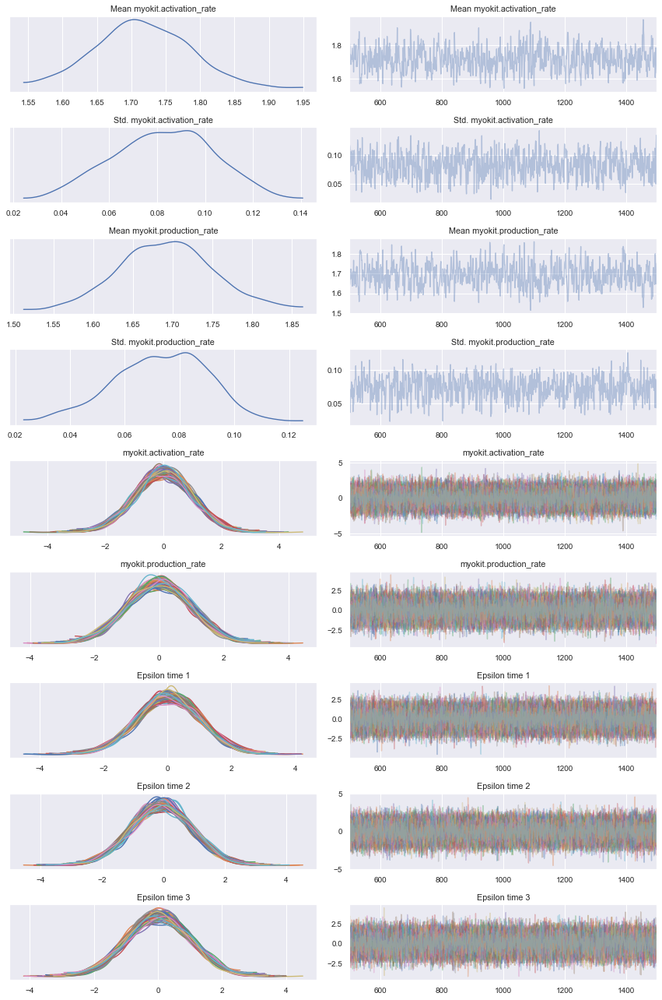

In [38]:
# Define population filter log-posterior
population_filter = chi.GaussianFilter(measurements)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate'], centered=False),
    # chi.PooledModel(n_dim=3, dim_names=[
    #     'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate'], centered=False)])
log_prior = pints.ComposedLogPrior(
    pints.LogNormalLogPrior(1, 0.5),   # Mean activation rate
    pints.LogNormalLogPrior(-2, 0.5),  # Std. activation rate
    # pints.LogNormalLogPrior(2, 0.8),   # deactivation rate
    # pints.LogNormalLogPrior(-3, 0.4),  # degradation rate (active)
    # pints.LogNormalLogPrior(-1, 0.4),  # degradation rate (inactive)
    pints.LogNormalLogPrior(1, 0.5),   # Mean production rate
    pints.LogNormalLogPrior(-2, 0.5))  # Std. production rate
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior,
    sigma=population_parameters[-1])

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

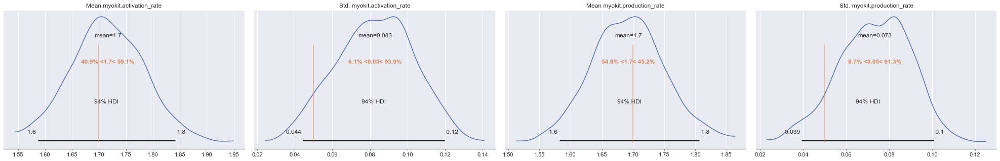

In [40]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean myokit.activation_rate',
        'Std. myokit.activation_rate',
        # 'Pooled Deactivation rate',
        # 'Pooled Deg. rate (act.)',
        # 'Pooled Deg. rate (inact.)',
        'Mean myokit.production_rate',
        'Std. myokit.production_rate'],
    ref_val=list(
        np.hstack([population_parameters[:2], population_parameters[-3:-1]])))
plt.tight_layout()

### Results

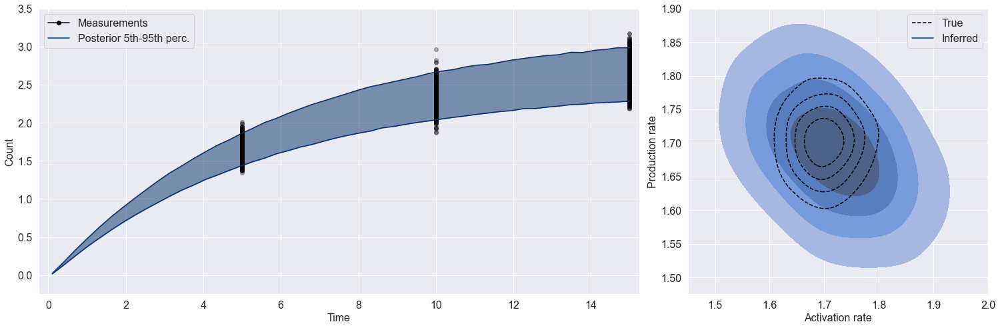

In [44]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(21, 7), gridspec_kw={'width_ratios': [2, 1]})

# Define population model (central parametrisation)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate']),
    # chi.PooledModel(n_dim=3, dim_names=[
    #     'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate'])])

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 5000
parameters =  posterior_samples_filter.sel(draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean myokit.activation_rate'].values.flatten(),
    parameters['Std. myokit.activation_rate'].values.flatten(),
    # parameters['Log std. Initial count'].values.flatten(),
    # parameters['Log std. Growth rate'].values.flatten(),
    parameters['Mean myokit.production_rate'].values.flatten(),
    parameters['Std. myokit.production_rate'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 2))
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes[1])

# Plot population filter inference results (measurement space)
times = np.linspace(0.1, 15)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
simulated_measurements = np.empty(shape=(n_samples, n_times))
parameters = np.empty(shape=(n_samples, 3))
parameters[:, :2] = samples
parameters[:, 2] = population_parameters[-1]
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[0, :, 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
axes[0].plot(
    times, fifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].plot(
    times, ninetyfifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].fill_between(
    times, fifth_percentile, ninetyfifth_percentile,
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(
    np.hstack([population_parameters[:2], population_parameters[-3:-1]]),
    n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])

# Plot measurement used for the inference as reference
times = np.array([5, 10, 15])
for idm, meas in enumerate(measurements):
    axes[0].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].plot(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
axes[0].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Posterior 5th-95th perc.')
axes[0].set_xlim([-0.25, 15.25])
axes[0].set_ylim([-0.25, 3.5])
axes[1].plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes[1].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes[1].set_xlim([1.45, 2])
axes[1].set_ylim([1.475, 1.9])
axes[1].set_xlabel('Activation rate', fontsize=fontsize)
axes[1].set_ylabel('Production rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[0].legend(fontsize=fontsize)
axes[1].legend(fontsize=fontsize)
plt.tight_layout()

## 2. Snapshot data from both active and inactive receptors

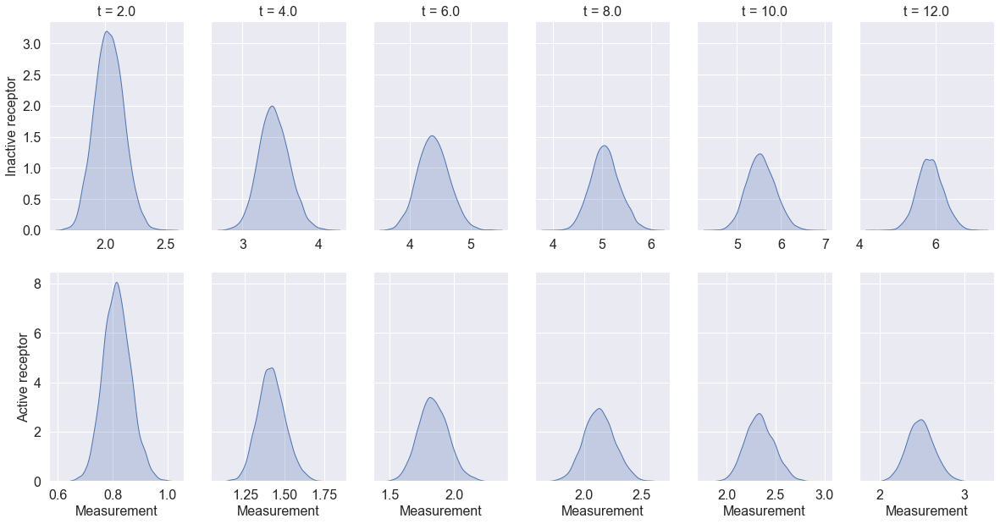

In [20]:
# Data-generating parameters
population_parameters = [
    1.7,   # Mean activation rate
    0.05,  # Std. activation rate
    8,     # deactivation rate
    0.015, # degradation rate (active)
    0.25,  # degradation rate (inactive)
    1.7,   # Mean production rate
    0.05,  # Std. production rate
    0.05,  # Sigma act.
    0.05]  # Sigma inact.

# Define mechanistic model
directory = os.path.dirname(os.getcwd())
mechanistic_model = chi.SBMLModel(
    directory + '/models/dixit_growth_factor_model.xml')
mechanistic_model = chi.ReducedMechanisticModel(mechanistic_model)
mechanistic_model.fix_parameters({
    'central.receptor_active_amount': 0,
    'central.receptor_inactive_amount': 0,
    'central.ligand_amount': 2,
    'central.size': 1
})

# Define data-generating model
error_models = [chi.LogNormalErrorModel(), chi.LogNormalErrorModel()]
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate']),
    chi.PooledModel(n_dim=3, dim_names=[
        'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate']),
    chi.PooledModel(dim_names=['Sigma act.']),
    chi.PooledModel(dim_names=['Sigma inact.'])])
predictive_model = chi.PredictiveModel(mechanistic_model, error_models)
predictive_model = chi.PopulationPredictiveModel(
    predictive_model, population_model)

# Simulate measurements
seed = 2
n_ids = 5000
times = [2, 4, 6, 8, 10, 12]
measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Visualise distributions over time
fontsize = '16'
fig, axes = plt.subplots(2, len(times), figsize=(20, 10), sharey='row')
axes[0, 0].set_ylabel('Inactive receptor', fontsize=fontsize)
axes[1, 0].set_ylabel('Active receptor', fontsize=fontsize)
for tid, time in enumerate(times):
    # Add title and x-label to subfigure
    axes[0, tid].set_title('t = %.1f' % time, fontsize=fontsize)
    axes[1, tid].set_xlabel('Measurement', fontsize=fontsize)
    axes[0, tid].tick_params(labelsize=fontsize)
    axes[1, tid].tick_params(labelsize=fontsize)

    # Plot KDE plot
    sns.kdeplot(
        x=measurements[0, tid], fill=True, linewidth=1, ax=axes[1, tid],
        legend=False)
    sns.kdeplot(
        x=measurements[1, tid], fill=True, linewidth=1, ax=axes[0, tid],
        legend=False)

plt.show()

In [23]:
# Simulate measurements
seed = 2
n_ids = 5000
times = np.array([1, 5, 10, 15, 20])
dense_measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Keep only one measurement per individual (100 measurements per time point)
n_ids = 1000
n_times = len(times)
n_observables = 2
measurements = np.empty(shape=(n_ids, n_observables, n_times))
for idt in range(n_times):
    start_ids = idt * n_ids
    end_ids = (idt + 1) * n_ids
    measurements[:, 0, idt] = dense_measurements[0, idt, start_ids:end_ids]
    measurements[:, 1, idt] = dense_measurements[1, idt, start_ids:end_ids]

# Visualise measurements
fig = go.Figure()
for idt in range(n_times):
    for idx in range(n_ids):
        fig.add_trace(go.Scatter(
            x=[times[idt]],
            y=[measurements[idx, 0, idt]],
            mode='markers+lines',
            name='ID %d' % (idt + (n_times * idx))
        ))
fig.update_layout(
    template='plotly_white',
    xaxis_title='Time',
    yaxis_title='Measurement'
)
fig.show()
fig = go.Figure()
for idt in range(n_times):
    for idx in range(n_ids):
        fig.add_trace(go.Scatter(
            x=[times[idt]],
            y=[measurements[idx, 1, idt]],
            mode='markers+lines',
            name='ID %d' % (idt + (n_times * idx))
        ))
fig.update_layout(
    template='plotly_white',
    xaxis_title='Time',
    yaxis_title='Measurement'
)
fig.show()

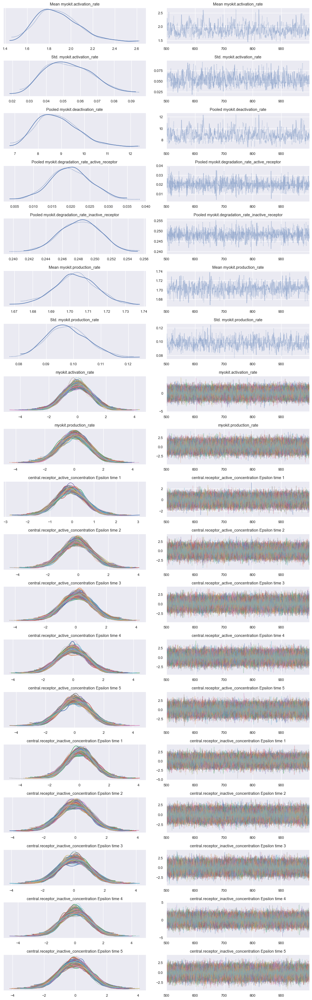

In [24]:
# Define population filter log-posterior
population_filter = chi.GaussianFilter(measurements)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate'], centered=False),
    chi.PooledModel(n_dim=3, dim_names=[
        'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate'], centered=False)])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(2, 0.5),      # Mean activation rate
    pints.LogNormalLogPrior(-2, 0.5),    # Std. activation rate
    pints.GaussianLogPrior(10, 2),       # deactivation rate
    pints.GaussianLogPrior(0.02, 0.005), # degradation rate (active)
    pints.GaussianLogPrior(0.3, 0.05),   # degradation rate (inactive)
    pints.GaussianLogPrior(2, 0.5),      # Mean production rate
    pints.LogNormalLogPrior(-2, 0.5))    # Std. production rate
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior,
    sigma=population_parameters[-2:])

# Load inference results
directory = os.getcwd()
chain_1 = xr.load_dataset(
    directory
    + '/derived_data/posteriors/growth_factor_model_2_outputs_chain_1.nc')
chain_2 = xr.load_dataset(
    directory
    + '/derived_data/posteriors/growth_factor_model_2_outputs_chain_2.nc')
posterior_samples = xr.concat(
    [chain_1, chain_2.assign_coords(chain=[1])], dim='chain')

# Plot traces
warmup = 500
thinning = 1
n_iterations = 1000
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

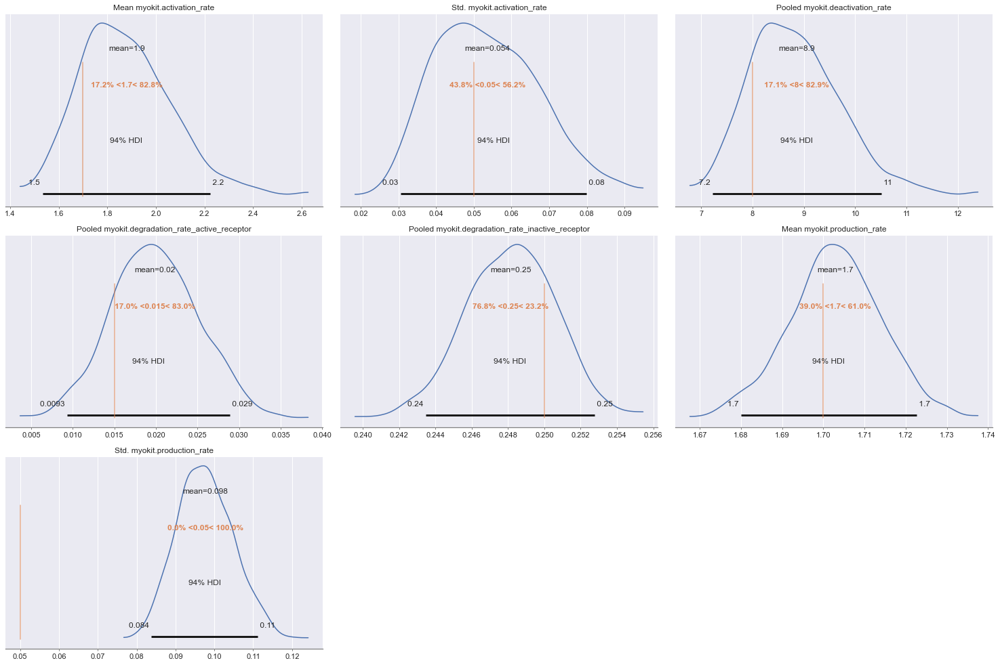

In [25]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean myokit.activation_rate',
        'Std. myokit.activation_rate',
        'Pooled myokit.deactivation_rate',
        'Pooled myokit.degradation_rate_active_receptor',
        'Pooled myokit.degradation_rate_inactive_receptor',
        'Mean myokit.production_rate',
        'Std. myokit.production_rate'],
    ref_val=population_parameters[:-2])
plt.tight_layout()

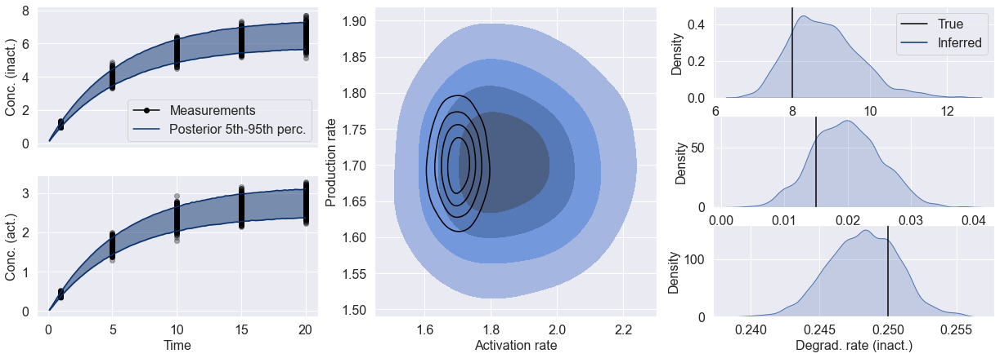

In [28]:
# Set up figure
fig = plt.figure(figsize=(21, 7))
ax1 = plt.subplot(231)
ax2 = plt.subplot(234)
time_series_axes = [ax1, ax2]
param_axes = [
    fig.add_subplot(1, 3, 2),
    fig.add_subplot(3, 3, 3),
    fig.add_subplot(3, 3, 6),
    fig.add_subplot(3, 3, 9)]

# Define population model (central parametrisation)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate']),
    chi.PooledModel(n_dim=3, dim_names=[
        'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate'])])

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 5000
parameters =  posterior_samples.sel(draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean myokit.activation_rate'].values.flatten(),
    parameters['Std. myokit.activation_rate'].values.flatten(),
    parameters['Pooled myokit.deactivation_rate'].values.flatten(),
    parameters[
        'Pooled myokit.degradation_rate_active_receptor'].values.flatten(),
    parameters[
        'Pooled myokit.degradation_rate_inactive_receptor'].values.flatten(),
    parameters['Mean myokit.production_rate'].values.flatten(),
    parameters['Std. myokit.production_rate'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 5))
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 4], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=param_axes[0])
sns.kdeplot(
    x=samples[:, 1], fill=True, ax=param_axes[1])
sns.kdeplot(
    x=samples[:, 2], fill=True, ax=param_axes[2])
sns.kdeplot(
    x=samples[:, 3], fill=True, ax=param_axes[3])

# Plot population filter inference results (measurement space)
times = np.linspace(0.1, 20, 100)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_models)
simulated_measurements = np.empty(shape=(n_samples, 2, n_times))
parameters = np.empty(shape=(n_samples, 7))
parameters[:, :5] = samples
parameters[:, 5] = population_parameters[-2]
parameters[:, 6] = population_parameters[-1]
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[..., 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
time_series_axes[0].plot(
    times, fifth_percentile[1], color=plt.get_cmap('Blues_r')(0))
time_series_axes[0].plot(
    times, ninetyfifth_percentile[1], color=plt.get_cmap('Blues_r')(0))
time_series_axes[0].fill_between(
    times, fifth_percentile[1], ninetyfifth_percentile[1],
    color=plt.get_cmap('Blues_r')(1), alpha=0.5)
time_series_axes[1].plot(
    times, fifth_percentile[0], color=plt.get_cmap('Blues_r')(0))
time_series_axes[1].plot(
    times, ninetyfifth_percentile[0], color=plt.get_cmap('Blues_r')(0))
time_series_axes[1].fill_between(
    times, fifth_percentile[0], ninetyfifth_percentile[0],
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(
    population_parameters[:-2], n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 4], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=param_axes[0])
param_axes[1].axvline(x=population_parameters[2], color='black')
param_axes[2].axvline(x=population_parameters[3], color='black')
param_axes[3].axvline(x=population_parameters[4], color='black')

# Plot measurement used for the inference as reference
times = np.array([1, 5, 10, 15, 20])
for idm, meas in enumerate(measurements):
    time_series_axes[1].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)
    time_series_axes[0].scatter(
        times, meas[1], color='black', marker='o', alpha=0.3)

# Legend, ranges axes labels
fontsize = 16
time_series_axes[1].set_xlabel('Time', fontsize=fontsize)
time_series_axes[0].set_ylabel('Conc. (inact.)', fontsize=fontsize)
time_series_axes[1].set_ylabel('Conc. (act.)', fontsize=fontsize)
time_series_axes[0].tick_params(labelsize=fontsize)
time_series_axes[0].set_xticks([])
time_series_axes[1].tick_params(labelsize=fontsize)
time_series_axes[0].plot(
    [10, 10], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
time_series_axes[0].plot(
    [10, 10], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Posterior 5th-95th perc.')
time_series_axes[0].set_ylim([-0.25, 8.25])
param_axes[1].plot(
    [10, 10], [100, 101], color='black', label='True')
param_axes[1].plot(
    [10, 10], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
param_axes[0].set_xlim([1.45, 2.3])
param_axes[0].set_ylim([1.49, 1.92])
param_axes[1].set_ylim([0, 0.5])
param_axes[0].set_xlabel('Activation rate', fontsize=fontsize)
param_axes[0].set_ylabel('Production rate', fontsize=fontsize)
param_axes[0].tick_params(labelsize=fontsize)
param_axes[1].set_xlabel('Deactivation rate', fontsize=fontsize)
param_axes[1].set_ylabel('Density', fontsize=fontsize)
param_axes[1].tick_params(labelsize=fontsize)
param_axes[2].set_xlabel('Degrad. rate (act.)', fontsize=fontsize)
param_axes[2].set_ylabel('Density', fontsize=fontsize)
param_axes[2].tick_params(labelsize=fontsize)
param_axes[3].set_xlabel('Degrad. rate (inact.)', fontsize=fontsize)
param_axes[3].set_ylabel('Density', fontsize=fontsize)
param_axes[3].tick_params(labelsize=fontsize)
time_series_axes[0].legend(fontsize=fontsize)
param_axes[1].legend(fontsize=fontsize)
plt.show()

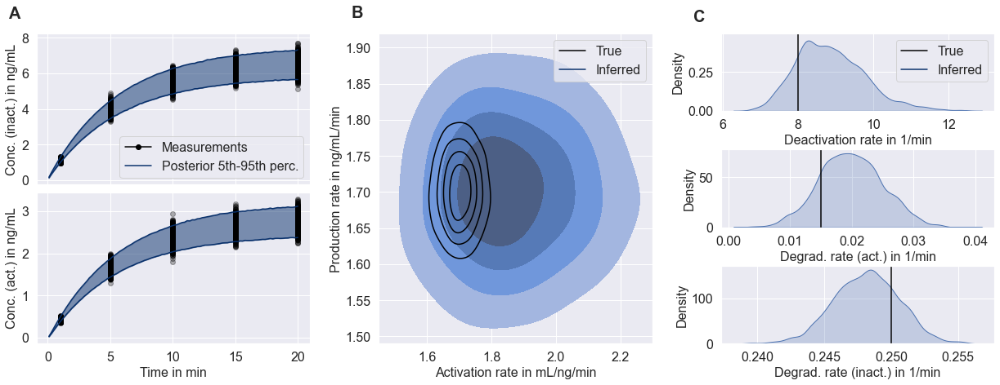

In [53]:
import string

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(21, 7))
outer = gridspec.GridSpec(1, 3, wspace=0.25)

# Create time series axes
inner = gridspec.GridSpecFromSubplotSpec(
    2, 1, subplot_spec=outer[0], hspace=0.05)
ax1 = plt.Subplot(fig, inner[0])
ax2 = plt.Subplot(fig, inner[1])
ax1.sharex(ax2)
time_series_axes = [ax1, ax2]

# Create axis for IIV parameters
ax3 = plt.Subplot(fig, outer[1])

# Create axes for pooled parameters
inner = gridspec.GridSpecFromSubplotSpec(
    3, 1, subplot_spec=outer[2], hspace=0.5)
ax4 = plt.Subplot(fig, inner[0])
ax5 = plt.Subplot(fig, inner[1])
ax6 = plt.Subplot(fig, inner[2])
param_axes = [ax3, ax4, ax5, ax6]

# Add axes to figure
for ax in (time_series_axes + param_axes):
    fig.add_subplot(ax)

# Define population model (central parametrisation)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate']),
    chi.PooledModel(n_dim=3, dim_names=[
        'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate'])])

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 5000
parameters =  posterior_samples.sel(draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean myokit.activation_rate'].values.flatten(),
    parameters['Std. myokit.activation_rate'].values.flatten(),
    parameters['Pooled myokit.deactivation_rate'].values.flatten(),
    parameters[
        'Pooled myokit.degradation_rate_active_receptor'].values.flatten(),
    parameters[
        'Pooled myokit.degradation_rate_inactive_receptor'].values.flatten(),
    parameters['Mean myokit.production_rate'].values.flatten(),
    parameters['Std. myokit.production_rate'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 5))
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 4], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=param_axes[0])
sns.kdeplot(
    x=samples[:, 1], fill=True, ax=param_axes[1])
sns.kdeplot(
    x=samples[:, 2], fill=True, ax=param_axes[2])
sns.kdeplot(
    x=samples[:, 3], fill=True, ax=param_axes[3])

# Plot population filter inference results (measurement space)
times = np.linspace(0.1, 20, 100)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_models)
simulated_measurements = np.empty(shape=(n_samples, 2, n_times))
parameters = np.empty(shape=(n_samples, 7))
parameters[:, :5] = samples
parameters[:, 5] = population_parameters[-2]
parameters[:, 6] = population_parameters[-1]
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[..., 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
time_series_axes[0].plot(
    times, fifth_percentile[1], color=plt.get_cmap('Blues_r')(0))
time_series_axes[0].plot(
    times, ninetyfifth_percentile[1], color=plt.get_cmap('Blues_r')(0))
time_series_axes[0].fill_between(
    times, fifth_percentile[1], ninetyfifth_percentile[1],
    color=plt.get_cmap('Blues_r')(1), alpha=0.5)
time_series_axes[1].plot(
    times, fifth_percentile[0], color=plt.get_cmap('Blues_r')(0))
time_series_axes[1].plot(
    times, ninetyfifth_percentile[0], color=plt.get_cmap('Blues_r')(0))
time_series_axes[1].fill_between(
    times, fifth_percentile[0], ninetyfifth_percentile[0],
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(
    population_parameters[:-2], n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 4], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=param_axes[0])
param_axes[1].axvline(x=population_parameters[2], color='black')
param_axes[2].axvline(x=population_parameters[3], color='black')
param_axes[3].axvline(x=population_parameters[4], color='black')

# Plot measurement used for the inference as reference
times = np.array([1, 5, 10, 15, 20])
for idm, meas in enumerate(measurements):
    time_series_axes[1].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)
    time_series_axes[0].scatter(
        times, meas[1], color='black', marker='o', alpha=0.3)

# Label axes
fontsize = 16
time_series_axes[1].set_xlabel('Time in min', fontsize=fontsize)
time_series_axes[0].set_ylabel('Conc. (inact.) in ng/mL', fontsize=fontsize)
time_series_axes[1].set_ylabel('Conc. (act.) in ng/mL', fontsize=fontsize)
time_series_axes[0].tick_params(labelsize=fontsize)
# time_series_axes[0].set_xticks([])
time_series_axes[1].tick_params(labelsize=fontsize)
time_series_axes[0].plot(
    [10, 10], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
time_series_axes[0].plot(
    [10, 10], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Posterior 5th-95th perc.')
time_series_axes[0].set_ylim([-0.25, 8.25])
param_axes[0].plot(
    [10, 10], [100, 101], color='black', label='True')
param_axes[0].plot(
    [10, 10], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
param_axes[1].plot(
    [10, 10], [100, 101], color='black', label='True')
param_axes[1].plot(
    [10, 10], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
param_axes[0].set_xlim([1.45, 2.3])
param_axes[0].set_ylim([1.49, 1.92])
param_axes[1].set_ylim([0, 0.499])
param_axes[0].set_xlabel('Activation rate in mL/ng/min', fontsize=fontsize)
param_axes[0].set_ylabel('Production rate in ng/mL/min', fontsize=fontsize)
param_axes[0].tick_params(labelsize=fontsize)
param_axes[1].set_xlabel('Deactivation rate in 1/min', fontsize=fontsize)
param_axes[1].set_ylabel('Density', fontsize=fontsize)
param_axes[1].tick_params(labelsize=fontsize)
param_axes[2].set_xlabel('Degrad. rate (act.) in 1/min', fontsize=fontsize)
param_axes[2].set_ylabel('Density', fontsize=fontsize)
param_axes[2].tick_params(labelsize=fontsize)
param_axes[3].set_xlabel('Degrad. rate (inact.) in 1/min', fontsize=fontsize)
param_axes[3].set_ylabel('Density', fontsize=fontsize)
param_axes[3].tick_params(labelsize=fontsize)
time_series_axes[0].legend(fontsize=fontsize)
param_axes[0].legend(fontsize=fontsize)
param_axes[1].legend(fontsize=fontsize)

# Label subplot groups
ax1.text(
    -0.1, 1.1, string.ascii_uppercase[0], transform=ax1.transAxes, size=20,
    weight='bold')
ax3.text(
    -0.1, 1.05, string.ascii_uppercase[1], transform=ax3.transAxes, size=20,
    weight='bold')
ax4.text(
    -0.1, 1.15, string.ascii_uppercase[2], transform=ax4.transAxes, size=20,
    weight='bold')
plt.show()

Uncertainty about pooled parameters leads to uncertainty about parameters that
display IIV. Together this leads to an overestimation of IIV, consistent with
the prior knowledge. This is in contrast to NMLE inference, where the inference
framework tends to underestimate IIV when uncertainty about bottom-level
parameters is large.

## 3. Snapshot data from both active and inactive receptors varying EGF concentrations

In [17]:
class GrowthFactorModel(chi.MechanisticModel):
    """
    A model that simulates inactive and active receptor concentrations in
    the presence of 2 distinct ligand concentrations.
    """
    def __init__(self, ligand_concs=[2, 10]):
        super(GrowthFactorModel, self).__init__()
        conc1, conc2 = ligand_concs
        self._ligand_concs = ligand_concs

        # Define models
        directory = os.path.dirname(os.getcwd())
        model1 = chi.SBMLModel(
            directory + '/models/dixit_growth_factor_model.xml')
        model1 = chi.ReducedMechanisticModel(model1)
        model1.fix_parameters({
            'central.receptor_active_amount': 0,
            'central.receptor_inactive_amount': 0,
            'central.ligand_amount': 2,
            'central.size': conc1
        })
        model2 = chi.SBMLModel(
            directory + '/models/dixit_growth_factor_model.xml')
        model2 = chi.ReducedMechanisticModel(model2)
        model2.fix_parameters({
            'central.receptor_active_amount': 0,
            'central.receptor_inactive_amount': 0,
            'central.ligand_amount': 2,
            'central.size': conc2
        })

        self._model1 = model1
        self._model2 = model2

    def copy(self):
        return GrowthFactorModel(self._ligand_concs)

    def enable_sensitivities(self, enabled):
        self._model1.enable_sensitivities(enabled)
        self._model2.enable_sensitivities(enabled)

    def has_sensitivities(self):
        return self._model1.has_sensitivities()

    def n_outputs(self):
        return 4

    def n_parameters(self):
        return self._model1.n_parameters()

    def outputs(self):
        outputs = self._model1.outputs()
        names = [
            n + ' ligand conc. ' + str(int(self._ligand_concs[0]))
            for n in outputs]
        names += [
            n + ' ligand conc. ' + str(int(self._ligand_concs[1]))
            for n in outputs]
        return names

    def parameters(self):
        return self._model1.parameters()

    def simulate(self, parameters, times):
        # Simulate model for two concentrations
        s1 = self._model1.simulate(parameters, times)
        s2 = self._model2.simulate(parameters, times)

        # Collect results
        n_times = len(times)
        sim = np.empty(shape=(4, n_times))
        if not self.has_sensitivities():
            sim[:2] = s1
            sim[2:] = s2
            return sim

        # Collect results and sensitivities
        dsim = np.empty(shape=(n_times, 4, self.n_parameters()))
        sim[:2] = s1[0]
        sim[2:] = s2[0]
        dsim[:, :2] = s1[1]
        dsim[:, 2:] = s2[1]
        return sim, dsim

In [26]:
# Data-generating parameters
population_parameters = [
    1.7,   # Mean activation rate
    0.05,  # Std. activation rate
    8,     # deactivation rate
    0.015, # degradation rate (active)
    0.25,  # degradation rate (inactive)
    1.7,   # Mean production rate
    0.05,  # Std. production rate
    0.05,  # Sigma act. ligand conc. 2
    0.05,  # Sigma inact. ligand conc. 2
    0.05,  # Sigma act. ligand conc. 10
    0.05]  # Sigma inact. ligand conc. 10

# Define mechanistic model
mechanistic_model = GrowthFactorModel(ligand_concs=[2, 10])

# Define data-generating model
error_models = [
    chi.LogNormalErrorModel(), chi.LogNormalErrorModel(),
    chi.LogNormalErrorModel(), chi.LogNormalErrorModel()]
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate']),
    chi.PooledModel(n_dim=3, dim_names=[
        'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate']),
    chi.PooledModel(n_dim=4, dim_names=[
        'Sigma act. ligand conc. 2',
        'Sigma inact. ligand conc. 2',
        'Sigma act. ligand conc. 10',
        'Sigma inact. ligand conc. 10'])])
predictive_model = chi.PredictiveModel(mechanistic_model, error_models)
predictive_model = chi.PopulationPredictiveModel(
    predictive_model, population_model)

In [27]:
# Simulate measurements
seed = 2
n_ids = 5000
times = np.array([1, 5, 10, 15, 20, 25])
dense_measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Keep only one measurement per individual (100 measurements per time point)
n_ids = 100
n_times = len(times)
n_observables = 4
measurements = np.empty(shape=(n_ids, n_observables, n_times))
for idt in range(n_times):
    start_ids = idt * n_ids
    end_ids = (idt + 1) * n_ids
    measurements[:, 0, idt] = dense_measurements[0, idt, start_ids:end_ids]
    measurements[:, 1, idt] = dense_measurements[1, idt, start_ids:end_ids]
    measurements[:, 2, idt] = dense_measurements[2, idt, start_ids:end_ids]
    measurements[:, 3, idt] = dense_measurements[3, idt, start_ids:end_ids]

# Visualise measurements
fig = go.Figure()
for idt in range(n_times):
    for idx in range(n_ids):
        fig.add_trace(go.Scatter(
            x=[times[idt]],
            y=[measurements[idx, 0, idt]],
            mode='markers+lines',
            name='Ligand conc. 2',
            marker_color='blue',
            showlegend=True if (idt == 0) and (idx == 0) else False
        ))
for idt in range(n_times):
    for idx in range(n_ids):
        fig.add_trace(go.Scatter(
            x=[times[idt]],
            y=[measurements[idx, 2, idt]],
            mode='markers+lines',
            name='Ligand conc. 10',
            marker_color='red',
            showlegend=True if (idt == 0) and (idx == 0) else False
        ))
fig.update_layout(
    template='plotly_white',
    xaxis_title='Time',
    yaxis_title='Measurement'
)
fig.show()
fig = go.Figure()
for idt in range(n_times):
    for idx in range(n_ids):
        fig.add_trace(go.Scatter(
            x=[times[idt]],
            y=[measurements[idx, 1, idt]],
            mode='markers+lines',
            name='Ligand conc. 2',
            marker_color='blue',
            showlegend=True if (idt == 0) and (idx == 0) else False
        ))
for idt in range(n_times):
    for idx in range(n_ids):
        fig.add_trace(go.Scatter(
            x=[times[idt]],
            y=[measurements[idx, 3, idt]],
            mode='markers+lines',
            name='Ligand conc. 10',
            marker_color='red',
            showlegend=True if (idt == 0) and (idx == 0) else False
        ))
fig.update_layout(
    template='plotly_white',
    xaxis_title='Time',
    yaxis_title='Measurement'
)
fig.show()

/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/arviz/plots/traceplot.py:212: UserWarning:

rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (33), generating only 20 plots



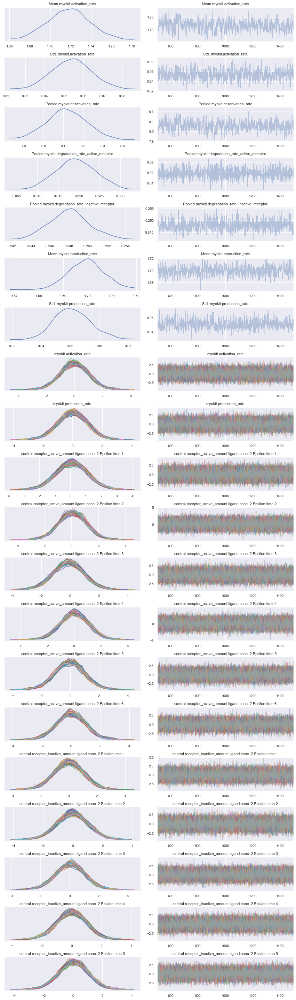

In [28]:
# Define population filter log-posterior
population_filter = chi.GaussianFilter(measurements)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate'], centered=False),
    chi.PooledModel(n_dim=3, dim_names=[
        'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate'], centered=False)])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(2, 0.5),      # Mean activation rate
    pints.LogNormalLogPrior(-2, 0.5),    # Std. activation rate
    pints.GaussianLogPrior(10, 2),       # deactivation rate
    pints.GaussianLogPrior(0.02, 0.005), # degradation rate (active)
    pints.GaussianLogPrior(0.3, 0.05),   # degradation rate (inactive)
    pints.GaussianLogPrior(2, 0.5),      # Mean production rate
    pints.LogNormalLogPrior(-2, 0.5))    # Std. production rate
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior,
    sigma=population_parameters[-4:], error_on_log_scale=False, n_samples=10)

# Load inference results
directory = os.getcwd()
posterior_samples = xr.load_dataset(
    directory
    + '/derived_data/posteriors/growth_factor_model_2_regimens.nc')

# Plot traces
warmup = 500
thinning = 1
n_iterations = 1500
az.plot_trace(
    posterior_samples.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

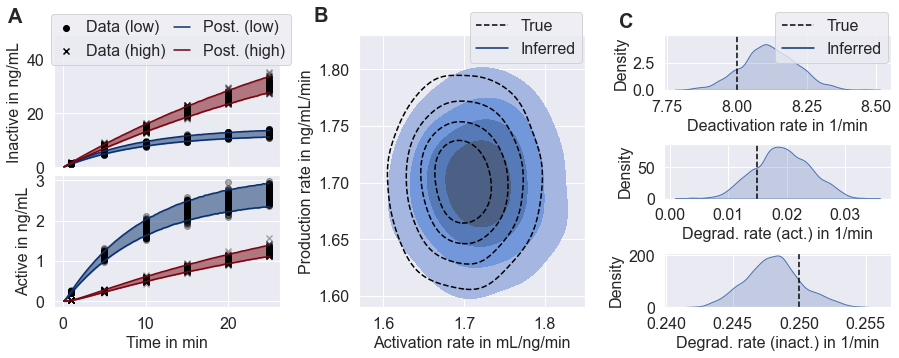

In [56]:
import string

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(15, 5))
outer = gridspec.GridSpec(1, 3, wspace=0.35)

# Create time series axes
inner = gridspec.GridSpecFromSubplotSpec(
    2, 1, subplot_spec=outer[0], hspace=0.05)
ax1 = plt.Subplot(fig, inner[0])
ax2 = plt.Subplot(fig, inner[1])
ax1.sharex(ax2)
time_series_axes = [ax1, ax2]

# Create axis for IIV parameters
ax3 = plt.Subplot(fig, outer[1])

# Create axes for pooled parameters
inner = gridspec.GridSpecFromSubplotSpec(
    3, 1, subplot_spec=outer[2], hspace=1)
ax4 = plt.Subplot(fig, inner[0])
ax5 = plt.Subplot(fig, inner[1])
ax6 = plt.Subplot(fig, inner[2])
param_axes = [ax3, ax4, ax5, ax6]

# Add axes to figure
for ax in (time_series_axes + param_axes):
    fig.add_subplot(ax)

# Define population model (central parametrisation)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(dim_names=['Activation rate']),
    chi.PooledModel(n_dim=3, dim_names=[
        'Deactivation rate', 'Deg. rate (act.)', 'Deg. rate (inact.)']),
    chi.GaussianModel(dim_names=['Production rate'])])

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 5000
parameters =  posterior_samples.sel(draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean myokit.activation_rate'].values.flatten(),
    parameters['Std. myokit.activation_rate'].values.flatten(),
    parameters['Pooled myokit.deactivation_rate'].values.flatten(),
    parameters[
        'Pooled myokit.degradation_rate_active_receptor'].values.flatten(),
    parameters[
        'Pooled myokit.degradation_rate_inactive_receptor'].values.flatten(),
    parameters['Mean myokit.production_rate'].values.flatten(),
    parameters['Std. myokit.production_rate'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 5))
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 4], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=param_axes[0])
sns.kdeplot(
    x=samples[:, 1], fill=True, ax=param_axes[1])
sns.kdeplot(
    x=samples[:, 2], fill=True, ax=param_axes[2])
sns.kdeplot(
    x=samples[:, 3], fill=True, ax=param_axes[3])

# Plot population filter inference results (measurement space)
times = np.linspace(0.1, 25, 100)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_models)
simulated_measurements = np.empty(shape=(n_samples, 4, n_times))
parameters = np.empty(shape=(n_samples, 9))
parameters[:, :5] = samples
parameters[:, 5] = population_parameters[-4]
parameters[:, 6] = population_parameters[-3]
parameters[:, 7] = population_parameters[-2]
parameters[:, 8] = population_parameters[-1]
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[..., 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
time_series_axes[0].plot(
    times, fifth_percentile[1], color=plt.get_cmap('Blues_r')(0))
time_series_axes[0].plot(
    times, ninetyfifth_percentile[1], color=plt.get_cmap('Blues_r')(0))
time_series_axes[0].fill_between(
    times, fifth_percentile[1], ninetyfifth_percentile[1],
    color=plt.get_cmap('Blues_r')(1), alpha=0.5)
time_series_axes[0].plot(
    times, fifth_percentile[3], color=plt.get_cmap('Reds_r')(10))
time_series_axes[0].plot(
    times, ninetyfifth_percentile[3], color=plt.get_cmap('Reds_r')(10))
time_series_axes[0].fill_between(
    times, fifth_percentile[3], ninetyfifth_percentile[3],
    color=plt.get_cmap('Reds_r')(10), alpha=0.5)
time_series_axes[1].plot(
    times, fifth_percentile[0], color=plt.get_cmap('Blues_r')(0))
time_series_axes[1].plot(
    times, ninetyfifth_percentile[0], color=plt.get_cmap('Blues_r')(0))
time_series_axes[1].fill_between(
    times, fifth_percentile[0], ninetyfifth_percentile[0],
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)
time_series_axes[1].plot(
    times, fifth_percentile[2], color=plt.get_cmap('Reds_r')(10))
time_series_axes[1].plot(
    times, ninetyfifth_percentile[2], color=plt.get_cmap('Reds_r')(10))
time_series_axes[1].fill_between(
    times, fifth_percentile[2], ninetyfifth_percentile[2],
    color=plt.get_cmap('Reds_r')(10), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(
    population_parameters[:-4], n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 4], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=param_axes[0], linestyles='--')
param_axes[1].axvline(x=population_parameters[2], color='black', linestyle='--')
param_axes[2].axvline(x=population_parameters[3], color='black', linestyle='--')
param_axes[3].axvline(x=population_parameters[4], color='black', linestyle='--')

# Plot measurement used for the inference as reference
times = np.array([1, 5, 10, 15, 20, 25])
for idm, meas in enumerate(measurements):
    time_series_axes[1].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)
    time_series_axes[0].scatter(
        times, meas[1], color='black', marker='o', alpha=0.3)
    time_series_axes[1].scatter(
        times, meas[2], color='black', marker='x', alpha=0.3)
    time_series_axes[0].scatter(
        times, meas[3], color='black', marker='x', alpha=0.3)

# Label axes
fontsize = 16
time_series_axes[1].set_xlabel('Time in min', fontsize=fontsize)
time_series_axes[0].set_ylabel('Inactive in ng/mL', fontsize=fontsize)
time_series_axes[1].set_ylabel('Active in ng/mL', fontsize=fontsize)
time_series_axes[0].tick_params(labelsize=fontsize)
# time_series_axes[0].set_xticks([])
time_series_axes[1].tick_params(labelsize=fontsize)
time_series_axes[0].scatter(
    [10, 10], [100, 101], color='black', linestyle='solid', marker='o',
    label='Data (low)')
time_series_axes[0].scatter(
    [10, 10], [100, 101], color='black', linestyle='solid', marker='x',
    label='Data (high)')
time_series_axes[0].plot(
    [10, 10], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Post. (low)')
time_series_axes[0].plot(
    [10, 10], [100, 101], color=plt.get_cmap('Reds_r')(0),
    linestyle='solid', label='Post. (high)')
time_series_axes[0].set_ylim([-0.25, 49])
param_axes[0].plot(
    [10, 10], [100, 101], color='black', label='True', linestyle='--')
param_axes[0].plot(
    [10, 10], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
param_axes[1].plot(
    [8, 8], [100, 101], color='black', label='True', linestyle='--')
param_axes[1].plot(
    [8, 8], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
param_axes[0].set_xlim([1.57, 1.85])
param_axes[0].set_ylim([1.59, 1.83])
param_axes[1].set_ylim([0, 4.99])
param_axes[0].set_xlabel('Activation rate in mL/ng/min', fontsize=fontsize)
param_axes[0].set_ylabel('Production rate in ng/mL/min', fontsize=fontsize)
param_axes[0].tick_params(labelsize=fontsize)
param_axes[1].set_xlabel('Deactivation rate in 1/min', fontsize=fontsize)
param_axes[1].set_ylabel('Density', fontsize=fontsize)
param_axes[1].tick_params(labelsize=fontsize)
param_axes[2].set_xlabel('Degrad. rate (act.) in 1/min', fontsize=fontsize)
param_axes[2].set_ylabel('Density', fontsize=fontsize)
param_axes[2].tick_params(labelsize=fontsize)
param_axes[3].set_xlabel('Degrad. rate (inact.) in 1/min', fontsize=fontsize)
param_axes[3].set_ylabel('Density', fontsize=fontsize)
param_axes[3].tick_params(labelsize=fontsize)
time_series_axes[0].legend(
    fontsize=fontsize, loc=[-0.01, 0.78], ncol=2, handlelength=1,
    columnspacing=0.5)
param_axes[0].legend(fontsize=fontsize, loc=[0.49, 0.9])
param_axes[1].legend(fontsize=fontsize, loc=[0.49, 0.5])

# Label subplot groups
ax1.text(
    -0.2, 1.1, string.ascii_uppercase[0], transform=ax1.transAxes, size=20,
    weight='bold')
ax3.text(
    -0.2, 1.05, string.ascii_uppercase[1], transform=ax3.transAxes, size=20,
    weight='bold')
ax4.text(
    -0.2, 1.15, string.ascii_uppercase[2], transform=ax4.transAxes, size=20,
    weight='bold')
plt.savefig('EGF_pathway_inference.pdf', bbox_inches='tight')
plt.show()